In [4]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [5]:
analysis_df = pd.read_csv("../data/test/all/metadata/all_audio_features.csv")
analysis_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre
0,0.692,0.886,1,-2.519,1,0.0519,0.284000,0.000000,0.3410,0.879,100.030,audio_features,4jdiqVbH1eUwc4MzDV7GMu,spotify:track:4jdiqVbH1eUwc4MzDV7GMu,https://api.spotify.com/v1/tracks/4jdiqVbH1eUw...,https://api.spotify.com/v1/audio-analysis/4jdi...,211013,4,kpop
1,0.618,0.760,6,-4.312,1,0.0596,0.006600,0.000000,0.1270,0.541,150.000,audio_features,6lM6yIDZ7kxFsgQCCfaLE2,spotify:track:6lM6yIDZ7kxFsgQCCfaLE2,https://api.spotify.com/v1/tracks/6lM6yIDZ7kxF...,https://api.spotify.com/v1/audio-analysis/6lM6...,221341,4,kpop
2,0.689,0.678,5,-4.287,0,0.1190,0.070200,0.000000,0.0889,0.335,145.883,audio_features,0yB4jrSwN0bFtFRDR5vyMj,spotify:track:0yB4jrSwN0bFtFRDR5vyMj,https://api.spotify.com/v1/tracks/0yB4jrSwN0bF...,https://api.spotify.com/v1/audio-analysis/0yB4...,200306,4,kpop
3,0.704,0.729,7,-3.851,1,0.0624,0.002400,0.000000,0.2180,0.710,129.992,audio_features,7fK0csBoqbcgUuWGV0cpoD,spotify:track:7fK0csBoqbcgUuWGV0cpoD,https://api.spotify.com/v1/tracks/7fK0csBoqbcg...,https://api.spotify.com/v1/audio-analysis/7fK0...,203520,4,kpop
4,0.681,0.814,11,-2.830,0,0.0603,0.145000,0.000000,0.5560,0.876,89.990,audio_features,6xy9JYFKcpb9L62PRNnYW5,spotify:track:6xy9JYFKcpb9L62PRNnYW5,https://api.spotify.com/v1/tracks/6xy9JYFKcpb9...,https://api.spotify.com/v1/audio-analysis/6xy9...,207053,4,kpop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3611,0.526,0.789,5,-7.342,0,0.0333,0.002200,0.017500,0.0850,0.209,74.995,audio_features,2XAjNdO20yRaXSGARd6fCw,spotify:track:2XAjNdO20yRaXSGARd6fCw,https://api.spotify.com/v1/tracks/2XAjNdO20yRa...,https://api.spotify.com/v1/audio-analysis/2XAj...,230142,4,rock
3612,0.553,0.868,6,-4.186,0,0.0480,0.000073,0.035900,0.0934,0.500,140.047,audio_features,4x241uAmPrxKZdCZKt2r5t,spotify:track:4x241uAmPrxKZdCZKt2r5t,https://api.spotify.com/v1/tracks/4x241uAmPrxK...,https://api.spotify.com/v1/audio-analysis/4x24...,216571,4,rock
3613,0.431,0.903,2,-5.462,1,0.1250,0.055500,0.002170,0.0883,0.133,186.036,audio_features,6Mf8ozEDo35UcgKgKajrBY,spotify:track:6Mf8ozEDo35UcgKgKajrBY,https://api.spotify.com/v1/tracks/6Mf8ozEDo35U...,https://api.spotify.com/v1/audio-analysis/6Mf8...,210962,4,rock
3614,0.537,0.878,9,-4.359,0,0.0392,0.004750,0.007060,0.0822,0.512,137.027,audio_features,3tyirD3obARHIGu2GBU3sC,spotify:track:3tyirD3obARHIGu2GBU3sC,https://api.spotify.com/v1/tracks/3tyirD3obARH...,https://api.spotify.com/v1/audio-analysis/3tyi...,262747,4,rock


In [15]:
numerical_feats = ['danceability','energy','loudness','key','mode',
                   'speechiness','acousticness','instrumentalness',
                   'liveness','valence','tempo', 'duration_ms']

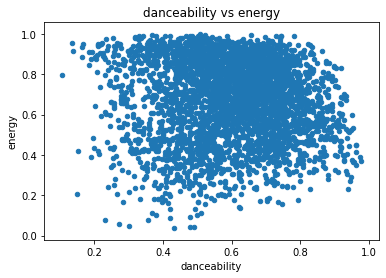

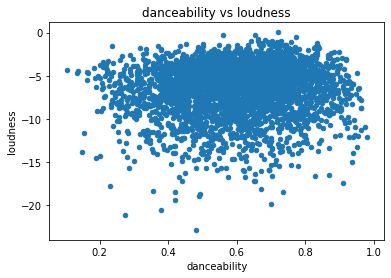

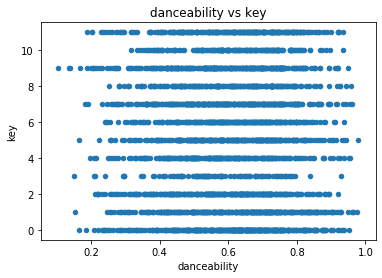

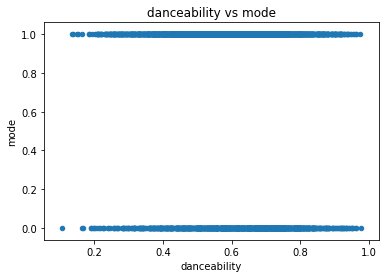

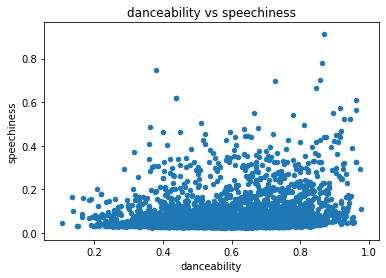

...

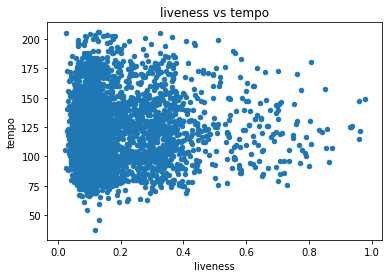

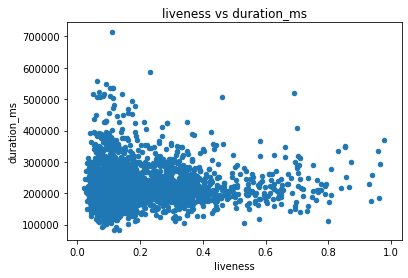

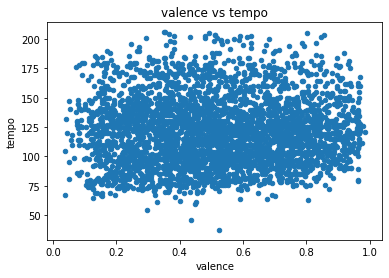

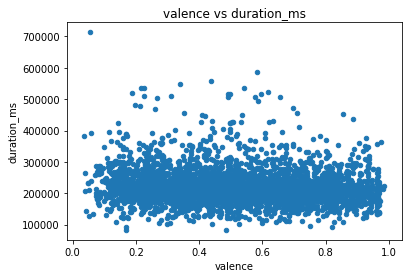

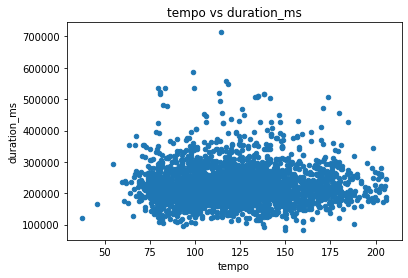

In [19]:
#scatter plots
list_of_pairs = [(numerical_feats[f1], numerical_feats[f2]) for f1 in range(len(numerical_feats)) for f2 in range(f1+1,len(numerical_feats))]
for i in list_of_pairs:
    analysis_df.plot.scatter(x=i[0], y=i[1], title=i[0] + ' vs ' + i[1])

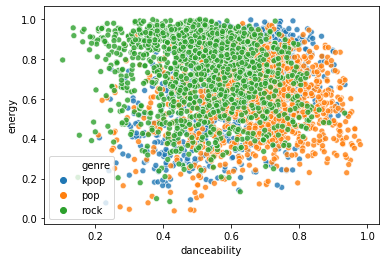

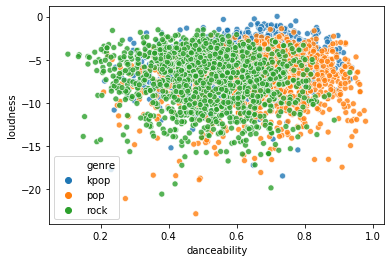

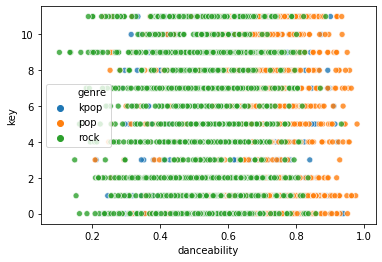

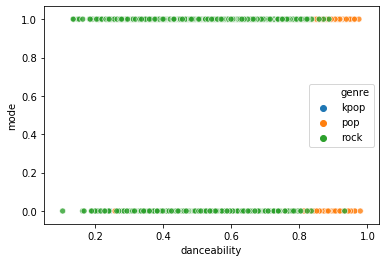

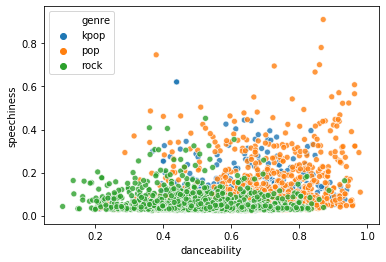

...

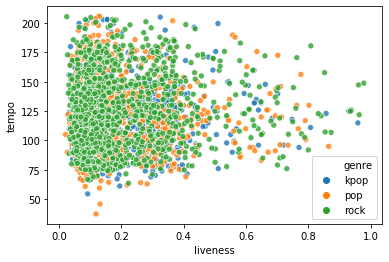

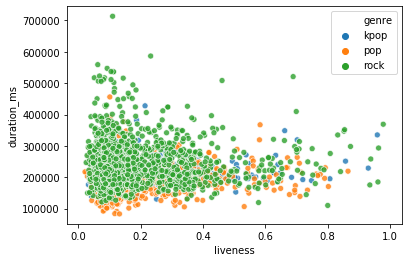

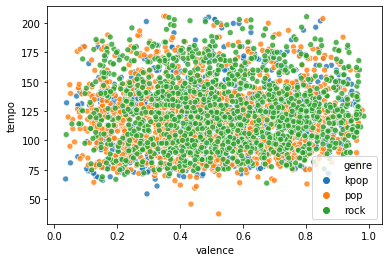

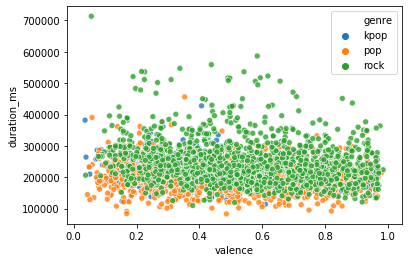

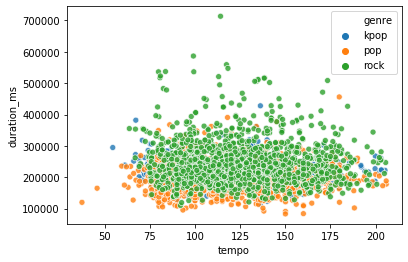

In [29]:
#scatter plots
import seaborn as sns

list_of_pairs = [(numerical_feats[f1], numerical_feats[f2]) for f1 in range(len(numerical_feats)) for f2 in range(f1+1,len(numerical_feats))]
for i in list_of_pairs:
    #analysis_df.plot.scatter(x=i[0], y=i[1], title=i[0] + ' vs ' + i[1],  hue='genre')
    sns.scatterplot(x=i[0], y=i[1], hue='genre', data=analysis_df, alpha=0.8) 
    plt.show()


In [13]:
medians = pd.DataFrame()
for i in numerical_feats:
    medians[i] = analysis_df.groupby(['genre'])[i].median()

medians = medians.reset_index()
medians

,genre,danceability,energy,loudness,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,kpop,0.651,0.704,-4.7140,5,1,0.0519,0.2670,0.000000,0.127,0.5100,119.9910,212130
1,pop,0.677,0.622,-6.3685,5,1,0.0556,0.1655,0.000000,0.115,0.4955,116.0215,198380
2,rock,0.521,0.770,-6.6940,5,1,0.0410,0.0325,0.000089,0.129,0.5430,122.0390,236507


C:\Users\samukund\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\Users\samukund\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\samukund\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib

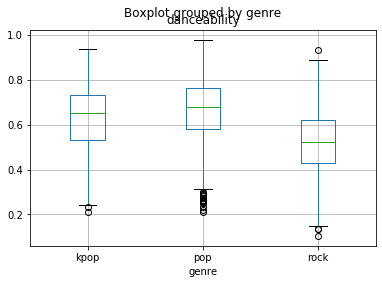

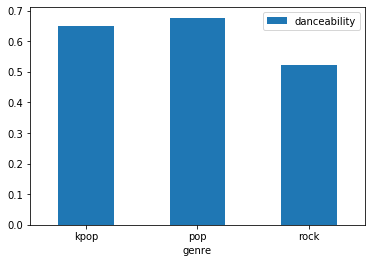

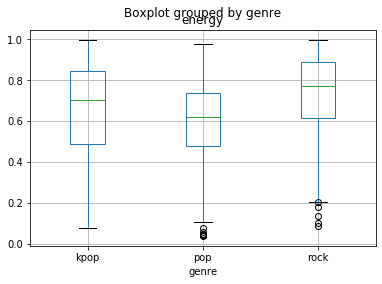

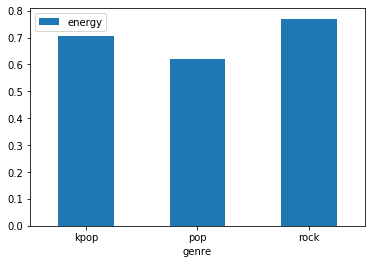

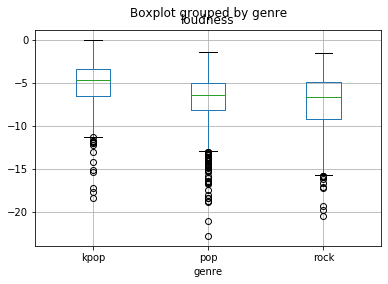

...

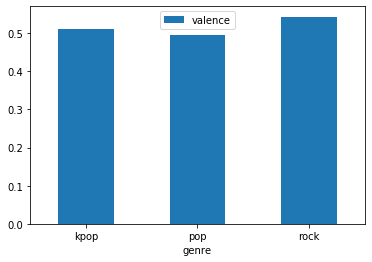

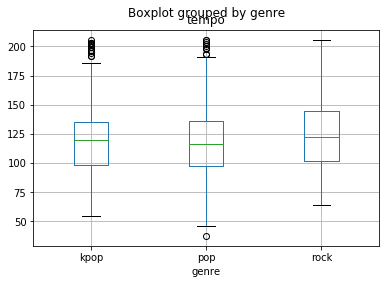

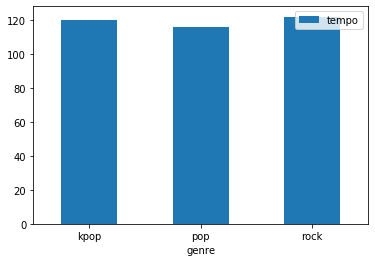

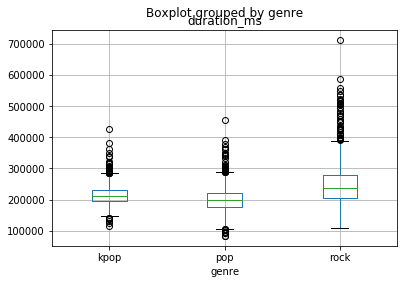

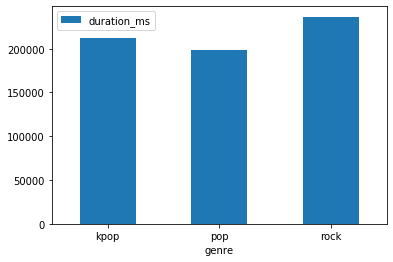

In [14]:
for i in numerical_feats:
    fig, ax = plt.subplots(figsize=(6,4))
    plt.suptitle('')
    analysis_df.boxplot(column=[i], by='genre', ax=ax)
    medians.plot.bar(x='genre', y=i, rot=0)

In [26]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

def sai_eda(csv_filepath):
    df = pd.read_csv(csv_filepath)
    numerical_feats = ['danceability','energy','loudness','key','mode',
                   'speechiness','acousticness','instrumentalness',
                   'liveness','valence','tempo']
    
    #scatter plots
    list_of_pairs = [(numerical_feats[f1], numerical_feats[f2]) for f1 in range(len(numerical_feats)) for f2 in range(f1+1,len(numerical_feats))]
    for i in list_of_pairs:
        sns.scatterplot(x=i[0], y=i[1], hue='genre', data=analysis_df, alpha=1) 
        plt.show()
        
    #creating dataframe for median bar graphs
    medians = pd.DataFrame()
    for i in numerical_feats:
        medians[i] = analysis_df.groupby(['genre'])[i].median()
    medians = medians.reset_index()
    
    #median bar graphs and box and whisker plots
    for i in numerical_feats:
        fig, ax = plt.subplots(figsize=(6,4))
        plt.suptitle('')
        analysis_df.boxplot(column=[i], by='genre', ax=ax)
        medians.plot.bar(x='genre', y=i, rot=0)

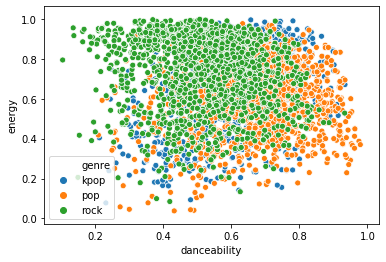

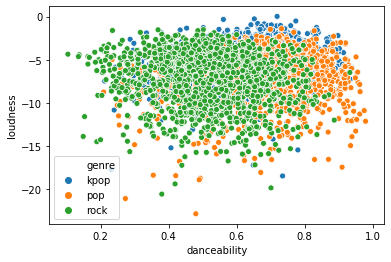

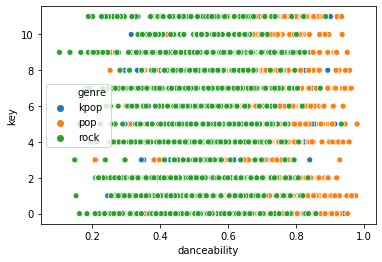

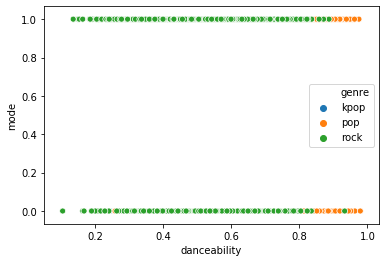

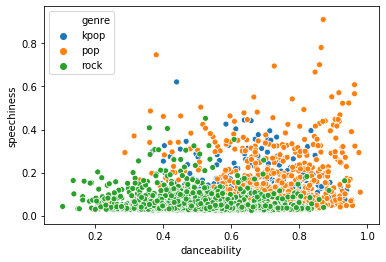

...

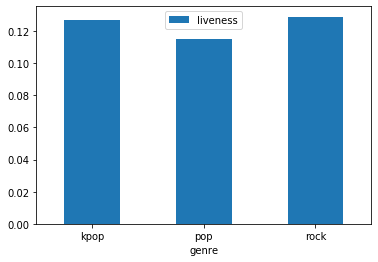

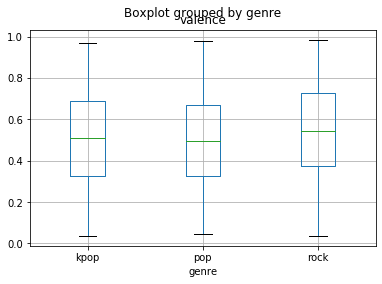

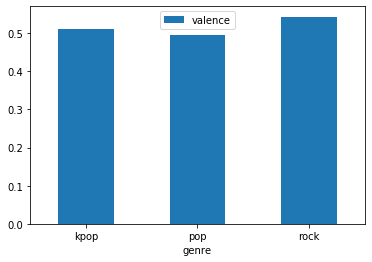

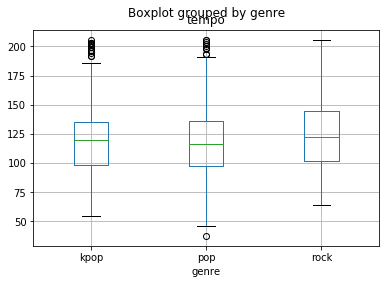

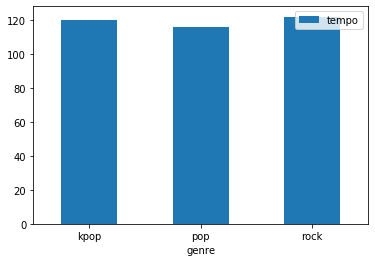

In [27]:
sai_eda("../data/test/all/metadata/all_audio_features.csv")